<a href="https://colab.research.google.com/github/gquinche/biocompuUNAL/blob/main/agreement/Soft_label_agreement_Prodiplosis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Preparación notebook




Por facilidad puedes ejecutar el script en colab directamente.

Sin embargo si quieres instalar localmente los paquetes y archivos puedes instalar conda y usar el siguiente comando como un archivo ".sh" en  *LINUX*. 

Asi los mismos estaran encapsulados y no generaran conflictos con tus paquetes o python global.

```
ENVNAME=prodi2 
source /home/biocompu/anaconda3/etc/profile.d/conda.sh
conda create --name $ENVNAME python=3.7
conda activate $ENVNAME
conda install pip
pip install jupyter_http_over_ws
cd ~/anaconda3/envs/$ENVNAME
conda info --envs
jupyter serverextension enable --py jupyter_http_over_ws
jupyter notebook   --NotebookApp.allow_origin='https://colab.research.google.com'   --port=8888   --NotebookApp.port_retries=0
```




## Los siguientes son la instalacion de los paquetes

In [ ]:
%%writefile requirements.txt
matplotlib==3.2.2
pandas==1.3.5
--index-url https://download.pytorch.org/whl/cu113/torch-1.11.0%2Bcu113-cp37-cp37m-linux_x86_64.whl #torch==1.11.0+cu113
torch  
--index-url https://download.pytorch.org/whl/cu113/torchvision-0.12.0%2Bcu113-cp37-cp37m-linux_x86_64.whl
torchvision
#torchvision==0.12.0
#pathlib==1.0.1
#pillow==9.0.1


Overwriting requirements.txt


In [ ]:
!pip install -r requirements.txt
#@markdown For PIL incompatibilities use the restart runtime option in Runtime menu to switch PIL version

ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


In [ ]:
#@title Importado librerias: np, pandas, PIL y glob (imagenes) y torch 
%matplotlib inline 
#to show plots in collab
import pandas as pd
import numpy as np

#instalar si es necesario con !pip install
from PIL import Image 
import glob 
import pathlib 

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import transforms

import matplotlib.pyplot as plt



In [ ]:
#@title Installation of gsutil to download images, 
#@markdown if conda is not found you probably are running in colab and gsutil is arleady installed.
!conda install --channel conda-forge gsutil --yes  # needed if running locally 

Solving environment: \ | / - \ | done


==> WARNING: A newer version of conda exists. <==
  current version: 4.13.0
  latest version: 4.14.0

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /home/biocompu/anaconda3/envs/prodi2

  added / updated specs:
    - gsutil


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2022.6.15.2|       ha878542_0         150 KB  conda-forge
    certifi-2022.6.15.2        |     pyhd8ed1ab_0         154 KB  conda-forge
    gsutil-5.13                |     pyhd8ed1ab_0         2.5 MB  conda-forge
    openssl-1.1.1q             |       h7f8727e_0         2.5 MB
    ------------------------------------------------------------
                                           Total:         5.3 MB

The following packages will be UPDATED:

  ca-certificates            

In [ ]:
!which gsutil

/home/biocompu/anaconda3/envs/prodi2/bin/gsutil


In [ ]:
#@title Download
!gsutil -m cp -r gs://images9r0d1 .

Copying gs://images9r0d1/models...
Copying gs://images9r0d1/optimizer...
Copying gs://images9r0d1/properties.csv...
Copying gs://images9r0d1/firstbatch/104.jpg...
Copying gs://images9r0d1/firstbatch/1.jpg...
Copying gs://images9r0d1/firstbatch/100.jpg...
Copying gs://images9r0d1/firstbatch/103.jpg...
Copying gs://images9r0d1/firstbatch/102.jpg...
Copying gs://images9r0d1/firstbatch/113.jpg...
Copying gs://images9r0d1/firstbatch/112.jpg...
Copying gs://images9r0d1/firstbatch/106.jpg...
Copying gs://images9r0d1/firstbatch/109.jpg...
Copying gs://images9r0d1/firstbatch/115.jpg...
Copying gs://images9r0d1/firstbatch/17.jpg...
Copying gs://images9r0d1/firstbatch/10.jpg...
Copying gs://images9r0d1/firstbatch/111.jpg...
Copying gs://images9r0d1/firstbatch/3.jpg...
Copying gs://images9r0d1/firstbatch/18.jpg...
Copying gs://images9r0d1/firstbatch/105.jpg...
Copying gs://images9r0d1/firstbatch/22.jpg...
Copying gs://images9r0d1/firstbatch/26.jpg...
Copying gs://images9r0d1/firstbatch/107.jpg...


In [ ]:
!ls ./images9r0d1/firstbatch

100.jpg  113.jpg  19.jpg  31.jpg  44.jpg  57.jpg  6.jpg   82.jpg  95.jpg
101.jpg  114.jpg  1.jpg   32.jpg  45.jpg  58.jpg  70.jpg  83.jpg  96.jpg
102.jpg  115.jpg  20.jpg  33.jpg  46.jpg  59.jpg  71.jpg  84.jpg  97.jpg
103.jpg  116.jpg  21.jpg  34.jpg  47.jpg  5.jpg   72.jpg  85.jpg  98.jpg
104.jpg  117.jpg  22.jpg  35.jpg  48.jpg  60.jpg  73.jpg  86.jpg  99.jpg
105.jpg  118.jpg  23.jpg  36.jpg  49.jpg  61.jpg  74.jpg  87.jpg  9.jpg
106.jpg  11.jpg   24.jpg  37.jpg  4.jpg   62.jpg  75.jpg  88.jpg
107.jpg  12.jpg   25.jpg  38.jpg  50.jpg  63.jpg  76.jpg  89.jpg
108.jpg  13.jpg   26.jpg  39.jpg  51.jpg  64.jpg  77.jpg  8.jpg
109.jpg  14.jpg   27.jpg  3.jpg   52.jpg  65.jpg  78.jpg  90.jpg
10.jpg	 15.jpg   28.jpg  40.jpg  53.jpg  66.jpg  79.jpg  91.jpg
110.jpg  16.jpg   29.jpg  41.jpg  54.jpg  67.jpg  7.jpg   92.jpg
111.jpg  17.jpg   2.jpg   42.jpg  55.jpg  68.jpg  80.jpg  93.jpg
112.jpg  18.jpg   30.jpg  43.jpg  56.jpg  69.jpg  81.jpg  94.jpg


# Extraccion de datos
9R0D1 es un codigo usada para guardar en la nube los datos relacionados a este algoritmo de reconocimiento de prodiplosis, si estas teniendo problema accediendo a estos datos puedes contactar con nosotros con un pantallazo del problema.

In [ ]:
propertiesRaw = pd.read_csv("./images9r0d1/properties.csv")
percentFix = True #@param 
#cambiamos unos formato
if(percentFix == True):
  propertiesRaw['general'] = propertiesRaw['general']/100
propertiesRaw['Imagen'] = propertiesRaw['Imagen'].astype(int)
propertiesRaw['color y forma'] = propertiesRaw['color y forma'].astype(float)
print(propertiesRaw)
# properties.iloc[:,1:5] = 0.5 # to test if some features were damaging the model



     Imagen  ovopositor  alas  antenas  color y forma  general  groups  \
0         1         0.0   1.0      0.0            1.0      0.8     0.0   
1         2         0.0   1.0      1.0            1.0      0.8     1.0   
2         3         0.0   0.0      1.0            1.0      0.6     1.0   
3         4         0.0   0.0      1.0            1.0      0.5     0.0   
4         5         0.0   0.0      1.0            1.0      0.5     0.0   
..      ...         ...   ...      ...            ...      ...     ...   
113     114         0.0   0.0      0.0            0.0      0.0     0.0   
114     115         0.0   0.0      0.0            0.0      0.0     0.0   
115     116         0.0   0.0      0.0            0.0      0.0     0.0   
116     117         0.0   0.0      0.0            0.0      0.0     0.0   
117     118         0.0   0.0      0.0            0.0      0.0     0.0   

     quality  
0          1  
1          1  
2          1  
3          1  
4          1  
..       ...  
113   

# Cambio de data para evitar probabilidades muy bajas


In [ ]:
evadeFullProbabilities = True #@param {type:"boolean"}
createOneHotProbabilities = True #@param {type:"boolean"}
#@markdown a seemengly modern approach to try to keep the usefull information 
#@markdown of soft labels, for example, by encryptying 0.2, 0.4,0.6 and 1 as four
createSoftLabelDual = True #@param {type:"boolean"}
#@markdown this option give us a column equal to 1-c, that is the probability of
#@markdown not belonging to the class, this allow us to use soft labels
#@markdown with the crossentropy (internally kldiv) loss


CreateHardClasses = True #@param {type:"boolean"}
#@markdown this just give us an extra column with the 0.5 cutoff class belonging
properties = pd.DataFrame.copy(propertiesRaw) # to evade mutating original data

properties.columns = [c.replace(' ', '_') for c in properties.columns]
print("before adjusting\n\n",properties)
if(evadeFullProbabilities):
  properties.antenas = (properties.antenas + 0.5)/2
  properties.ovopositor = (properties.ovopositor + 0.5)/2
  properties.alas = (properties.alas + 0.5)/2
  properties.color_y_forma = (properties.color_y_forma + 0.5)/2
if(createSoftLabelDual):
  properties["trueNegative"] = 1-properties["general"]
if(CreateHardClasses):
  properties["hardClasses"] = np.round(properties.general)
  print(properties.general < 0.2)


properties

before adjusting

      Imagen  ovopositor  alas  antenas  color_y_forma  general  groups  \
0         1         0.0   1.0      0.0            1.0      0.8     0.0   
1         2         0.0   1.0      1.0            1.0      0.8     1.0   
2         3         0.0   0.0      1.0            1.0      0.6     1.0   
3         4         0.0   0.0      1.0            1.0      0.5     0.0   
4         5         0.0   0.0      1.0            1.0      0.5     0.0   
..      ...         ...   ...      ...            ...      ...     ...   
113     114         0.0   0.0      0.0            0.0      0.0     0.0   
114     115         0.0   0.0      0.0            0.0      0.0     0.0   
115     116         0.0   0.0      0.0            0.0      0.0     0.0   
116     117         0.0   0.0      0.0            0.0      0.0     0.0   
117     118         0.0   0.0      0.0            0.0      0.0     0.0   

     quality  
0          1  
1          1  
2          1  
3          1  
4          1  
..

,Imagen,ovopositor,alas,antenas,color_y_forma,general,groups,quality,trueNegative,hardClasses
0,1,0.25,0.75,0.25,0.75,0.8,0.0,1,0.2,1.0
1,2,0.25,0.75,0.75,0.75,0.8,1.0,1,0.2,1.0
2,3,0.25,0.25,0.75,0.75,0.6,1.0,1,0.4,1.0
3,4,0.25,0.25,0.75,0.75,0.5,0.0,1,0.5,0.0
4,5,0.25,0.25,0.75,0.75,0.5,0.0,1,0.5,0.0
...,...,...,...,...,...,...,...,...,...,...
113,114,0.25,0.25,0.25,0.25,0.0,0.0,0,1.0,0.0
114,115,0.25,0.25,0.25,0.25,0.0,0.0,0,1.0,0.0
115,116,0.25,0.25,0.25,0.25,0.0,0.0,0,1.0,0.0
116,117,0.25,0.25,0.25,0.25,0.0,0.0,0,1.0,0.0


In [ ]:
#@title Load as tensor all the images
PATH = "./images9r0d1/firstbatch/*.jpg" #@param 
firstCol =  1 #@param
endCol =  9 #@param  
print(properties.iloc[:,firstCol:endCol].iloc[4])
useZeroIndexing = True #@param {type:"boolean"}
offset = 1 if useZeroIndexing else 0


image_map = map(Image.open, glob.glob(PATH)) 
image_mapcopy = map(Image.open, glob.glob(PATH)) 
tensorims = [0]*len(list(image_mapcopy))
imagelist = torch.zeros(len(tensorims),endCol-firstCol+1)
print(imagelist.size())
print(type(imagelist))

for i,image in enumerate(image_map,0):
  minusjpg = image.filename[:-4] #remove  .jpg end
  filename = minusjpg[len(PATH)-5:] #discount five chars to start from "*.jpg"  asterisk 

  # select from dataframe the images ordered and 
  # with the features we are interested with
  score = properties.iloc[:,firstCol:endCol].iloc[int(filename)-offset] 

  
  #create a tensor list of the features for pytorch
  
  left = torch.tensor([int(filename)])
  right = torch.tensor(score)

      

  # para importar imagenes a torch como tensor
  imagelist[i,:] = torch.cat((left,right))
  tensorims[int(filename)-offset]=(transforms.ToTensor()(image).unsqueeze_(0)) 

torch.set_printoptions(precision=3,sci_mode=False)

print(imagelist)
orderedFeaturesTensor = torch.stack(sorted(imagelist, key=lambda a: a[0]))
print(orderedFeaturesTensor)


ovopositor       0.25
alas             0.25
antenas          0.75
color_y_forma    0.75
general          0.50
groups           0.00
quality          1.00
trueNegative     0.50
Name: 4, dtype: float64
torch.Size([118, 9])
<class 'torch.Tensor'>
tensor([[   55.000,     0.750,     0.750,  ...,     1.000,     1.000,
             0.100],
        [  103.000,     0.250,     0.250,  ...,     1.000,     1.000,
             1.000],
        [   82.000,     0.250,     0.250,  ...,     0.000,     1.000,
             0.900],
        ...,
        [   40.000,     0.250,     0.250,  ...,     0.000,     1.000,
             1.000],
        [   14.000,     0.250,     0.250,  ...,     1.000,     1.000,
             0.800],
        [    2.000,     0.250,     0.750,  ...,     1.000,     1.000,
             0.200]])
tensor([[  1.000,   0.250,   0.750,  ...,   0.000,   1.000,   0.200],
        [  2.000,   0.250,   0.750,  ...,   1.000,   1.000,   0.200],
        [  3.000,   0.250,   0.250,  ...,   1.000,   1.0

In [ ]:
tensorims[0].size()

torch.Size([1, 3, 480, 640])

## Vizualization

In [ ]:
def imFromTensor(featureVector):
  return tensorims[int(featureVector[0].item())-offset]

tensor([1.000, 0.250, 0.750, 0.250, 0.750, 0.800, 0.000, 1.000, 0.200])


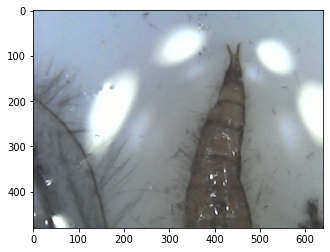

tensor([2.000, 0.250, 0.750, 0.750, 0.750, 0.800, 1.000, 1.000, 0.200])


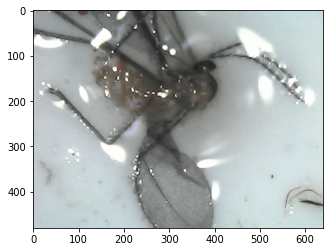

tensor([3.000, 0.250, 0.250, 0.750, 0.750, 0.600, 1.000, 1.000, 0.400])


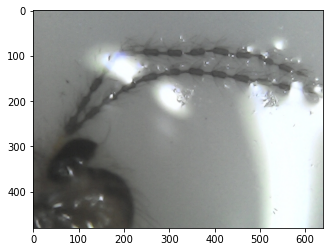

tensor([4.000, 0.250, 0.250, 0.750, 0.750, 0.500, 0.000, 1.000, 0.500])


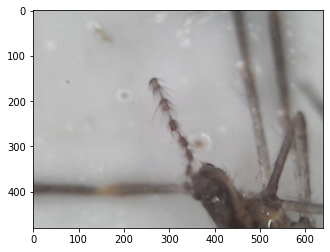

tensor([5.000, 0.250, 0.250, 0.750, 0.750, 0.500, 0.000, 1.000, 0.500])


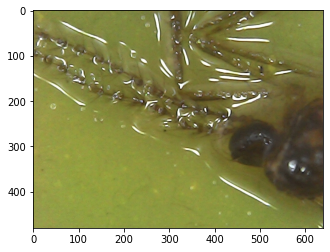

In [ ]:
def color(x):
  ttps://arxiv.org/pdf/1901.08827.pdf
  return torch.flatten(imFromTensor(x),0,1).permute(1, 2, 0)
  #assumes x is a image index
  #flatten to remove a extra pair of brackets
  #permute to change from pil to matplotlib standard tensor permutation 

imagesToShow =  5 #@param {type:"integer"}
import matplotlib.pyplot as plt
for i,imScore in enumerate(orderedFeaturesTensor,0):
  if(i<imagesToShow):
    print(imScore)
    plt.imshow(color(imScore))
    plt.show()

tensor([1.000, 0.250, 0.750, 0.250, 0.750, 0.800, 0.000, 1.000, 0.200])


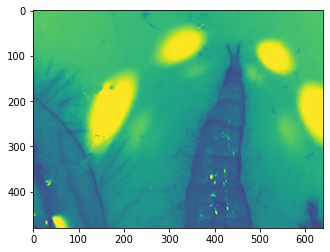


tensor([2.000, 0.250, 0.750, 0.750, 0.750, 0.800, 1.000, 1.000, 0.200])


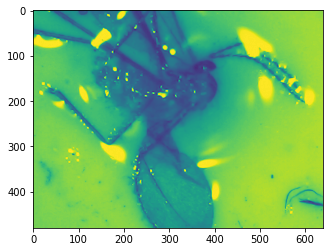


tensor([3.000, 0.250, 0.250, 0.750, 0.750, 0.600, 1.000, 1.000, 0.400])


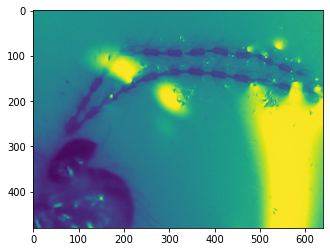


tensor([4.000, 0.250, 0.250, 0.750, 0.750, 0.500, 0.000, 1.000, 0.500])


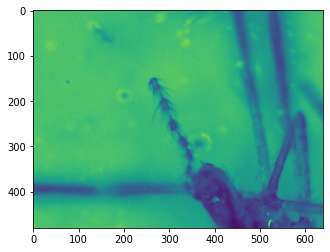


tensor([5.000, 0.250, 0.250, 0.750, 0.750, 0.500, 0.000, 1.000, 0.500])


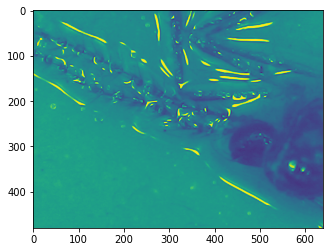

In [ ]:
#@title Black and White filter check 
def bAndW(x):
  
  blackwhite = torchvision.transforms.Grayscale()(imFromTensor(x))
  return torch.flatten(blackwhite,0,2)
  #assumes x is a image and Score pair
  #flatten to remove a extra pair of brackets


imagesToShow =  5#@param {type:"integer"}
import torchvision
import matplotlib.pyplot as plt
for i,imScore in enumerate(orderedFeaturesTensor,0):
  if(i<5):
    print(imScore)
    plt.imshow(bAndW(imScore))
    plt.show()
    print()



# Creation of Network


## Architecture 
Here we construct a deep CNN based on the alex net, we add three fully connected
layers at the end that will work toward using a learned supervised parameter related to the pressence of wings, antennas and the reproduction aparatus of the insect

#### AlexNet that tries to learn specific labels Learned features


In [ ]:
#@title 
torch.manual_seed(22)
class mutatedAlexNet(nn.Module):
# variation on Alex net
    def __init__(self):
        super(Net, self).__init__()
        # 1 input image channel, 6 output channels, 5x5 square convolution
        # kernel

        self.conv1 = nn.Conv2d(1, 96, (11,11),stride=4) #the three is for rgb
        self.conv2 = nn.Conv2d(96, 256, (5,5),padding=2)
        self.conv3 = nn.Conv2d(256,384,(3,3),padding=1)
        self.conv4 = nn.Conv2d(384,384,(3,3),padding=1)
        self.conv5 = nn.Conv2d(384,256,(3,3),padding=1)
        # an affine operation: y = Wx + b
        self.fc1 = nn.Linear(256 * 6 * 6, 4096)
        self.fc2 = nn.Linear(4096, 1024)

        # end of Alex net
        # start of 
        self.fc3 = nn.Linear(1024, 1024)
        # Extra depth for using features 
        self.fc4 = nn.Linear(1024, 1024 )
        self.fc5 = nn.Linear(1024, 1024 )
        self.fc6 = nn.Linear(1024, 2 )


    def forward(self, x):
        #Alex net BUT WITH GRAYSCALE

        x = torchvision.transforms.Grayscale()(x)
        # Max pooling over a (2, 2) window
        # print(x.size())
        x = transforms.Normalize((0.5),(0.2))(x)
        
        x = nn.AdaptiveAvgPool2d((227,227))(x) #only compresses a little image
        #para previsualizar compresion
        # plt.imshow(torch.flatten(x,0,2))
        # plt.show()
        
        x = F.max_pool2d(F.leaky_relu(self.conv1(x)), (3,3),stride=2)
        x = F.max_pool2d(F.leaky_relu(self.conv2(x)),(3,3),stride=2)
        x = F.leaky_relu(self.conv3(x))
        x = F.leaky_relu(self.conv4(x))
        x = F.max_pool2d(F.leaky_relu(self.conv5(x)),(3,3),stride=2)
        x = torch.flatten(x, 0) #flatten all dimensions except the batch dimension
        x = F.leaky_relu(self.fc1(x))
        x = F.leaky_relu(self.fc2(x))
        #extra depth
        x = F.leaky_relu(self.fc3(x))
        x = F.leaky_relu(self.fc4(x))
        x = F.leaky_relu(self.fc5(x))
        x = F.leaky_relu(self.fc6(x))


        # print("arrived here")
        return torch.cat((features,x)) #we  use sigmoid in the loss itself as doing so 
        # is suggested for a more stable descent , see BCEWithLogitsLoss torchs docs  



#### simpler net

In [ ]:
#@title 
useGrayscale = True #@param
#@markdown this allow us to prevent the network to just learn the color from the 
#@markdown background of the image
class simplerNet(nn.Module):
# variation on Alex net
  def __init__(self):
    super(simplerNet, self).__init__()
    # 1 input image channel, 6 output channels, 5x5 square convolution
    # kernelttps://arxiv.org/pdf/1901.08827.pdf

    self.conv1 = nn.Conv2d(3, 96, (11,11),stride=4) #the three is for rgb
    self.conv2 = nn.Conv2d(96, 256, (5,5),padding=2)
    self.conv3 = nn.Conv2d(256,384,(3,3),padding=1)
    self.conv4 = nn.Conv2d(384,384,(3,3),padding=1)
    self.conv5 = nn.Conv2d(384,256,(3,3),padding=1)
    # an affine operation: y = Wx + b
    self.fc1 = nn.Linear(256 * 6 * 6, 1024)
    self.fc2 = nn.Linear(1024, 1024)

    # end of Alex net
    # start of 
    self.fc3 = nn.Linear(1024,1024)
    # Extra depth for using features 
    self.fc4 = nn.Linear(1024, 1024 )
    self.fc5 = nn.Linear(1024, 1024 )
    self.fc6 = nn.Linear(1024, 2 )


  def forward(self, x):
    #Alex net BUT WITH GRAYSCALE
    if(useGrayscale):
      x = torchvision.transforms.Grayscale(3)(x) #3 replicates the bw to the 
      # 3 rgb channels
    # Max pooling over a (2, 2) window
    x = transforms.Normalize((0.5),(0.2))(x)
    
    x = nn.AdaptiveAvgPool2d((227,227))(x) #only compresses a little image
    
    x = F.max_pool2d(F.leaky_relu(self.conv1(x)), (3,3),stride=2)
    x = F.max_pool2d(F.leaky_relu(self.conv2(x)),(3,3),stride=2)
    x = F.leaky_relu(self.conv3(x))
    x = F.leaky_relu(self.conv4(x))
    x = F.max_pool2d(F.leaky_relu(self.conv5(x)),(3,3),stride=2)
    x = torch.flatten(x,1,-1) #flatten all dimensions except the batch dimension
    x = F.leaky_relu(self.fc1(x))
    x = F.leaky_relu(self.fc2(x))
    #features = x[ :4 ] #take first 4 components to try to learn in them the features

    #extra depth
    x = F.leaky_relu(self.fc3(x))
    x = F.leaky_relu(self.fc4(x))
    x = F.leaky_relu(self.fc5(x))
    x = self.fc6(x)
    return x
  #we dont use softmax, as crossentropy and BCE work better when calculated 
  # without it  



In [ ]:
net = simplerNet()
print(net)
tensorsToShow = 10 #@param 
# for i,imAndScore in enumerate(orderedFeaturesTensor):
#   if(i>tensorsToShow):break
#   out = net(imFromTensor(imAndScore))
#   print(f" with {imAndScore} image we got a \n {out}",end="\n\n")
  
#   print(out)
for i in range(1):
  outRandom = torch.randn(10,3,512,512)
  print(net(outRandom))

simplerNet(
  (conv1): Conv2d(3, 96, kernel_size=(11, 11), stride=(4, 4))
  (conv2): Conv2d(96, 256, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (conv3): Conv2d(256, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(384, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (fc1): Linear(in_features=9216, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=1024, bias=True)
  (fc3): Linear(in_features=1024, out_features=1024, bias=True)
  (fc4): Linear(in_features=1024, out_features=1024, bias=True)
  (fc5): Linear(in_features=1024, out_features=1024, bias=True)
  (fc6): Linear(in_features=1024, out_features=2, bias=True)
)
tensor([[-0.002, -0.004],
        [-0.002, -0.004],
        [-0.002, -0.004],
        [-0.002, -0.004],
        [-0.002, -0.004],
        [-0.002, -0.004],
        [-0.002, -0.004],
        [-0.002, -0.004],
        [-0.002, -0.

## Show the number of layers and their parameters 

In [ ]:
numberOfLayers = 0
for param_tensor in net.state_dict():
    print(param_tensor, "\t", net.state_dict()[param_tensor].size())
    numberOfLayers += 1

conv1.weight 	 torch.Size([96, 3, 11, 11])
conv1.bias 	 torch.Size([96])
conv2.weight 	 torch.Size([256, 96, 5, 5])
conv2.bias 	 torch.Size([256])
conv3.weight 	 torch.Size([384, 256, 3, 3])
conv3.bias 	 torch.Size([384])
conv4.weight 	 torch.Size([384, 384, 3, 3])
conv4.bias 	 torch.Size([384])
conv5.weight 	 torch.Size([256, 384, 3, 3])
conv5.bias 	 torch.Size([256])
fc1.weight 	 torch.Size([1024, 9216])
fc1.bias 	 torch.Size([1024])
fc2.weight 	 torch.Size([1024, 1024])
fc2.bias 	 torch.Size([1024])
fc3.weight 	 torch.Size([1024, 1024])
fc3.bias 	 torch.Size([1024])
fc4.weight 	 torch.Size([1024, 1024])
fc4.bias 	 torch.Size([1024])
fc5.weight 	 torch.Size([1024, 1024])
fc5.bias 	 torch.Size([1024])
fc6.weight 	 torch.Size([2, 1024])
fc6.bias 	 torch.Size([2])


Show a layer for debugging of the model 

In [ ]:
extraLayerToShow = -1 #@param
for i,tensor in enumerate(net.parameters(),0): 
  if(i==extraLayerToShow): print(tensor) #last set of weights
  if(i==numberOfLayers-2): print(tensor) #last set of weights
  if(i==numberOfLayers-1): print(tensor) #last bias

Parameter containing:
tensor([[ 0.029,  0.020,  0.007,  ..., -0.013, -0.020, -0.001],
        [ 0.004,  0.007,  0.028,  ...,  0.016, -0.004,  0.024]],
       requires_grad=True)
Parameter containing:
tensor([ 0.013, -0.004], requires_grad=True)


# Carga de pesos preentrenados 
En este notebook vamos a cargar los pesos de un modelo preentrenado, mientras en este [otro](https://colab.research.google.com/drive/1jgdPiDv-nWToO7I4mw5Uhpo6JT8GpiLC#scrollTo=lVdZtQkHWhbJ) hacemos un entrenamiento de cero 

In [ ]:
# net = Net()

In [ ]:
# !gsutil -m cp -r gs://images9r0d1/pretrain . 

In [ ]:
# net.load_state_dict(torch.load("./pretrain/models2"))
# net.eval()

In [ ]:
# imagesToTestInNet = 10 #@param
# for i,imAndScore in enumerate(orderedFeaturesTensor):ttps://arxiv.org/pdf/1901.08827.pdf

#   # print(imp)
#   if(i>imagesToTestInNet):break
#   print(imAndScore)
#   out = net(imFromTensor(imAndScore))
#   print(f"result is {out}\n")
  
#   # print(out)

# Stablish the optimizer and training process


Zero the gradient buffers of all parameters and backprops with random
gradients:



para implementar mini batches si no tenemos ya una estructura con los mismos https://stackoverflow.com/questions/45113245/how-to-get-mini-batches-in-pytorch-in-a-clean-and-efficient-way

Example of a loss plot 

/home/biocompu/anaconda3/envs/prodi2/lib/python3.7/site-packages/numpy/core/shape_base.py:65: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  ary = asanyarray(ary)
/home/biocompu/anaconda3/envs/prodi2/lib/python3.7/site-packages/numpy/core/shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


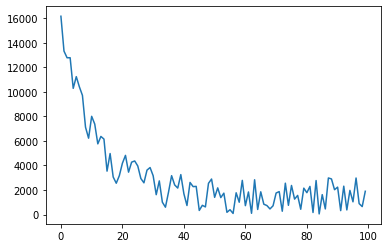

In [ ]:
import matplotlib.pyplot as plot
fun = lambda i: (1.1**(100-i))+torch.rand(1)*3000
plot.plot([(fun(i)) for i in range(100)])

In [ ]:
X = (torch.stack(tensorims))
X = torch.flatten(X,1,2) #respect the first dimension and not flatten
# xToTake = [1,2] #@param
#@ this allows to test memorization problem
print(f"our whole dataset size is {X.size()}")
print(f"a sample of a batch extraction of it has size {X[[1,2,3]].size()}")

columnsToTrainOn = [5,8] #@paramttps://arxiv.org/pdf/1901.08827.pdf
print(f"a sample of the training data {orderedFeaturesTensor[[1,2,3],:]}")
Y = orderedFeaturesTensor[:,columnsToTrainOn] #extract columns to optimize for 
print(Y[[1,2,3],:])ttps://arxiv.org/pdf/1901.08827.pdf


our whole dataset size is torch.Size([118, 3, 480, 640])
a sample of a batch extraction of it has size torch.Size([3, 3, 480, 640])
a sample of the training data tensor([[2.000, 0.250, 0.750, 0.750, 0.750, 0.800, 1.000, 1.000, 0.200],
        [3.000, 0.250, 0.250, 0.750, 0.750, 0.600, 1.000, 1.000, 0.400],
        [4.000, 0.250, 0.250, 0.750, 0.750, 0.500, 0.000, 1.000, 0.500]])
tensor([[0.800, 0.200],
        [0.600, 0.400],
        [0.500, 0.500]])


# Agreement test


# $k$ choice for cross validation  

We select the $k$ size by optimizing for the most separation on agreement 

# Hold One out or cross validation
We will now use the choosen $k$ validation sets and use early stopping within  our $k$ validation set, and 

In [ ]:
xSize = X.size()[0]
X_train = X[xSize//2:,:]
Y_train = Y[xSize//2:,:]
X_valid = X[:xSize//2,:]
Y_valid = Y[:xSize//2,:]
print(f"valid size is {X_valid.size()}")
print(f"valid size is {X_train.size()}")

print(f"valid size is {Y_valid.size()}")
print(f"valid size is {Y_train.size()}")

valid size is torch.Size([59, 3, 480, 640])
valid size is torch.Size([59, 3, 480, 640])
valid size is torch.Size([59, 2])
valid size is torch.Size([59, 2])


In [ ]:
def holdOneOut(X,Y,oneIndex):
  data_size = X.size()[0]-1
  myslice = list(range(oneIndex)) + list(range(oneIndex+1,data_size+1))
  X_train = X[myslice]
  Y_train = Y[myslice]
  testX = X[oneIndex:oneIndex+1]
  testY = Y[oneIndex]
  torch.manual_seed(oneIndex)
  net = simplerNet()
  print(nn.Softmax(dim=1)(net(testX)))



  optimizer = optim.Adam(net.parameters(), lr=0.00025)

  printParams = False #@param {type:"boolean"}
  for i,j in enumerate(net.parameters(),0):
              # print(j)
              if i==numberOfLayers-1 and printParams: #imprime ultimos weight
                print(j)

  losscounter = 0
  lossregistry = []
  #@markdown positive weight should be equal to  examples / positive examples 
  pos_weight = 10 #@param
  
  batch_size = 10 #@param
  plot_slowFactor = 10 #@param
  #@markdown this param simply change how often to print outputs and plots
  #@markdown the bigger the less frequent we print parameters

  #@markdown this can help with how sensitive is the neural network to examples


  #section to work later on on the vien of using more knowledge from
  # the experts and try to force the network to learn them 
  # labelsToIdentifyPerImage = 1 #@param
  # useMultilabelLoss = False #@param
  # if(useMultilabelLoss):
  #   customLoss = nn.MultiLabelSoftMarginLoss(torch.tensor([1,1,1,1,100]))
  # elif(createSoftLabelDual):
  #   customLoss = nn.CrossEntropyLoss(weight=torch.tensor([7,1]))
  # else:
  #   customeLoss = nn.BCEWithLogitsLoss(pos_weight=torch.tensor(pos_weight))


  amortizedMax = 100 #@param
  #@markdown this value allows for a more conveniente vizualization of loss
  NUMBEROFEPOCHS = 100 #@param

  for epoch in range(NUMBEROFEPOCHS):  # loop over the dataset multiple times in a random way
      permutation = torch.randperm(data_size) 
      running_loss = 0
      batches = 0
      for i in range(0,data_size, batch_size): # to do batch_size jumps
          
          
        optimizer.zero_grad()
        batches += 1 #to calculate a mean
        indices = permutation[i:i+batch_size]
        # print("this are my indices",indices)

        batch_x, batch_y = X_train[indices], Y_train[indices]
ttps://arxiv.org/pdf/1901.08827.pdf
        outputs = net.forward(batch_x)
        loss = customLoss(outputs,batch_y)
        # if(loss.item()>amortizedMax):
        #   condition = np.abs(batch_y-outputs.detach())>0.2
        #   print("this is my outlier condition",condition) 
        #   toPrint = (f"\nthe outlier loss indices are {indices[condition]}\n")
        #   print(toPrint)
        amortizedMax = ((0.99)*amortizedMax+(0.01)*loss.item())
        if((i/(batch_size*plot_slowFactor))% (batch_size*plot_slowFactor) ==1):
          print(f"example of batch output is {nn.Softmax(dim=1)(outputs.detach())}")
          print(f"output size is {outputs.size()}")
          print(f"ground truths are{batch_y}")
          plot.ylim(0,amortizedMax)
          plot.plot(lossregistry)ttps://arxiv.org/pdf/1901.08827.pdf
          plot.show()

        loss.backward()
        optimizer.step()
        running_loss += loss.detach()ttps://arxiv.org/pdf/1901.08827.pdf
        lossregistry += [loss.detach().item()] 

        print(f"\n loss was {loss}\n")
      
      spaces = 5 #@param
      #@markdown to make it easier to see loss per epoch
      print('\n'*spaces,f"LOSS THIS EPOCH WAS {running_loss/batches}", '\n'*spaces)

      #   # print statistics
      # running_loss += loss.sum().item()
      # if labels[-1]>0.5:    # print every 2000 mini-batches
      #   print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss/losscounter:.3f}')
      #   running_loss = 0.0
      #   losscounter = 0
      #   print(f"with image {imageref} got output {outputs} when correct label was {labels} got an score of {loss} and changed parameters like so \n")
      #   for i,j in enumerate(net.parameters()):
      #     # print(j)
      #     if i==14: #imprime ultimos weight
      #       print(j)

  print('Finished Training')
  output = nn.Softmax(dim=1)(net(testX)).detach()
  return running_loss,output,testY
xSize = X.size()[0]
registry = []
for i in range(xSize):
  cache = holdOneOut(X,Y,i) 
  print(cache)
  registry += cache

In [ ]:
registry

[tensor(9.665),
 tensor([[0.721, 0.279]], grad_fn=<SoftmaxBackward0>),
 tensor([0.800, 0.200]),
 tensor(9.162),
 tensor([[    0.000,     1.000]], grad_fn=<SoftmaxBackward0>),
 tensor([0.800, 0.200]),
 tensor(9.262),
 tensor([[0.919, 0.081]], grad_fn=<SoftmaxBackward0>),
 tensor([0.600, 0.400]),
 tensor(9.197),
 tensor([[0.008, 0.992]], grad_fn=<SoftmaxBackward0>),
 tensor([0.500, 0.500]),
 tensor(9.003),
 tensor([[    0.000,     1.000]], grad_fn=<SoftmaxBackward0>),
 tensor([0.500, 0.500]),
 tensor(9.135),
 tensor([[0.428, 0.572]], grad_fn=<SoftmaxBackward0>),
 tensor([0.500, 0.500]),
 tensor(9.491),
 tensor([[    0.000,     1.000]], grad_fn=<SoftmaxBackward0>),
 tensor([0.300, 0.700]),
 tensor(12.187),
 tensor([[0.408, 0.592]], grad_fn=<SoftmaxBackward0>),
 tensor([0.300, 0.700]),
 tensor(9.095),
 tensor([[0.886, 0.114]], grad_fn=<SoftmaxBackward0>),
 tensor([0.300, 0.700]),
 tensor(9.116),
 tensor([[0.837, 0.163]], grad_fn=<SoftmaxBackward0>),
 tensor([0.300, 0.700]),
 tensor(9.159),

In [ ]:
allLosses = []
allOutputs = []
allTargets = []
for i in range(len(registry)):
  if(i%3==0): allLosses.append(registry[i])
  if(i%3==1): allOutputs.append(registry[i].data)
  if(i%3==2): allTargets.append(registry[i].data)
allLosses = torch.tensor(allLosses)
allOutputs = torch.cat(allOutputs)
allTargets = torch.stack(allTargets)
perf = (allOutputs - allTargets)
print(torch.mean(perf,axis=0))
print(torch.min(perf,axis=0))
print(torch.max(perf,axis=0))


tensor([ 0.156, -0.156])
torch.return_types.min(
values=tensor([-0.900, -0.920]),
indices=tensor([54, 82]))
torch.return_types.max(
values=tensor([0.920, 0.900]),
indices=tensor([82, 54]))


# Muestreo del rendimiento del modelo con un histograma de errores 


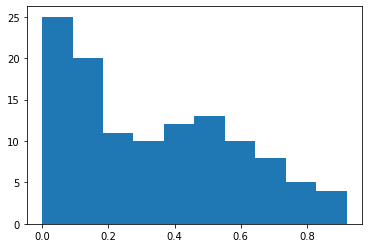

In [ ]:
plot.hist(torch.abs(perf[:,0]).numpy())
plot.show()

Para demostrar el rendimiento comparativo de uando predecimos más clases negativas que positivas vamos a permitir signo en la anterior tabla

Aqui los valores más negativos indican que el target era mucho más grande que el output, mientras que los valores más positivos indican que el target era mucho menor que que el output arrojado

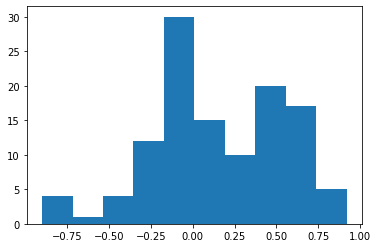

In [ ]:
plot.hist((perf[:,0]).numpy())
plot.show()

dado la anterior parece nuestra red esta fallando especialmente asociando más probabilidad de la correcta a los ejemplos 

# Guardado de parametros del modelo 

In [ ]:
# PATH = "./models"
# torch.save(net.state_dict(),PATH)


In [ ]:
# PATH = "./optimizer"
# torch.save(optimizer.state_dict(),PATH)

Puesta a prueba 

In [ ]:
#@title Descarga de archivos de entrenamiento
!gsutil -m cp -r gs://images9r0d1/pretrain/testing/ .

Copying gs://images9r0d1/pretrain/testing/1.jpg...
Copying gs://images9r0d1/pretrain/testing/10.jpg...
Copying gs://images9r0d1/pretrain/testing/11.jpg...
Copying gs://images9r0d1/pretrain/testing/12.jpg...
Copying gs://images9r0d1/pretrain/testing/125.jpeg...
Copying gs://images9r0d1/pretrain/testing/126.jpeg...
Copying gs://images9r0d1/pretrain/testing/127.jpeg...
Copying gs://images9r0d1/pretrain/testing/13.jpg...
Copying gs://images9r0d1/pretrain/testing/14.jpg...
Copying gs://images9r0d1/pretrain/testing/15.jpg...
Copying gs://images9r0d1/pretrain/testing/2.jpg...
Copying gs://images9r0d1/pretrain/testing/3.jpg...
Copying gs://images9r0d1/pretrain/testing/4.jpg...
Copying gs://images9r0d1/pretrain/testing/5.jpg...
Copying gs://images9r0d1/pretrain/testing/6.jpg...
Copying gs://images9r0d1/pretrain/testing/7.jpg...
Copying gs://images9r0d1/pretrain/testing/9.jpg...
- [17/17 files][580.8 KiB/580.8 KiB] 100% Done                                  
Operation completed over 17 objects/5

In [ ]:
PATH = "./testing/*.jpg"

testimage_map = map(Image.open, glob.glob(PATH)) 
testimage_mapcopy = map(Image.open, glob.glob(PATH)) 
testtensorims = []
testimagelist = []
print(testtensorims)

for i,image in enumerate(testimage_map,0):
  testtensorims.append(transforms.ToTensor()(image).unsqueeze_(0))
  minusjpg = image.filename[:-4] #remove  .jpg end
  filename = minusjpg[len(PATH)-5:] #discount five chars to start from "*.jpg"  asterisk 
  score = 0.5
  testimagelist.append((int(filename),torch.tensor(score,dtype=torch.float32).view(1)/100))

print(testimagelist)
print(sorted(testimagelist))


[]
[(15, tensor([0.005])), (4, tensor([0.005])), (3, tensor([0.005])), (9, tensor([0.005])), (6, tensor([0.005])), (10, tensor([0.005])), (7, tensor([0.005])), (11, tensor([0.005])), (12, tensor([0.005])), (1, tensor([0.005])), (13, tensor([0.005])), (5, tensor([0.005])), (14, tensor([0.005])), (2, tensor([0.005]))]
[(1, tensor([0.005])), (2, tensor([0.005])), (3, tensor([0.005])), (4, tensor([0.005])), (5, tensor([0.005])), (6, tensor([0.005])), (7, tensor([0.005])), (9, tensor([0.005])), (10, tensor([0.005])), (11, tensor([0.005])), (12, tensor([0.005])), (13, tensor([0.005])), (14, tensor([0.005])), (15, tensor([0.005]))]


In [ ]:
testtensorims[0]

tensor([[[[0.518, 0.525, 0.557,  ..., 0.729, 0.718, 0.718],
          [0.518, 0.514, 0.553,  ..., 0.714, 0.737, 0.737],
          [0.514, 0.506, 0.569,  ..., 0.698, 0.714, 0.718],
          ...,
          [0.827, 0.820, 0.820,  ..., 0.592, 0.584, 0.584],
          [0.824, 0.812, 0.800,  ..., 0.604, 0.584, 0.584],
          [0.812, 0.800, 0.784,  ..., 0.608, 0.588, 0.588]],

         [[0.518, 0.525, 0.557,  ..., 0.729, 0.718, 0.718],
          [0.518, 0.514, 0.553,  ..., 0.714, 0.737, 0.737],
          [0.514, 0.506, 0.569,  ..., 0.698, 0.714, 0.718],
          ...,
          [0.827, 0.820, 0.820,  ..., 0.592, 0.584, 0.584],
          [0.824, 0.812, 0.800,  ..., 0.604, 0.584, 0.584],
          [0.812, 0.800, 0.784,  ..., 0.608, 0.588, 0.588]],

         [[0.518, 0.525, 0.557,  ..., 0.729, 0.718, 0.718],
          [0.518, 0.514, 0.553,  ..., 0.714, 0.737, 0.737],
          [0.514, 0.506, 0.569,  ..., 0.698, 0.714, 0.718],
          ...,
          [0.827, 0.820, 0.820,  ..., 0.592, 0.584,

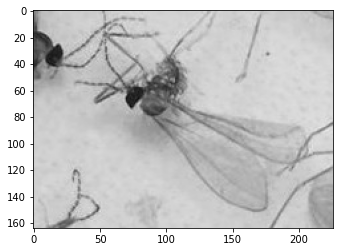

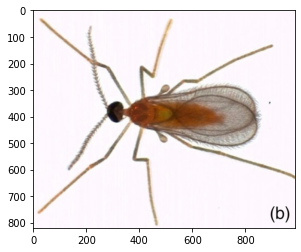

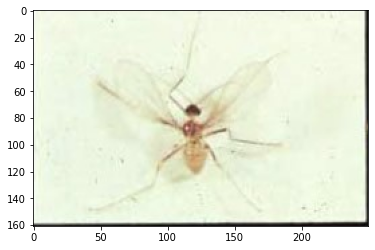

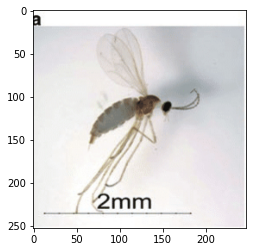

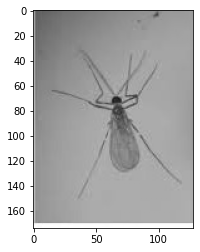

...

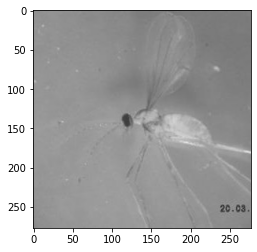

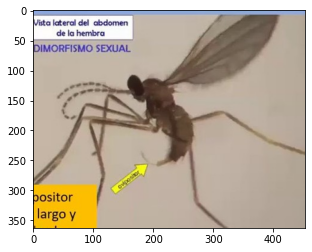

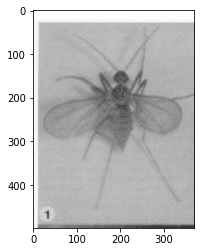

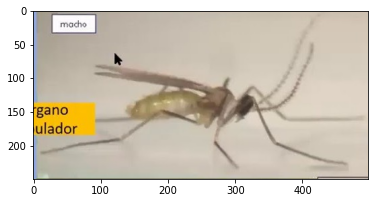

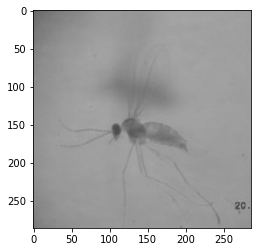

In [ ]:
import matplotlib.pyplot as plt
for i,tensor in enumerate((testtensorims),0):
    plt.imshow(torch.flatten(tensor,0,1).permute(1, 2, 0))
    plt.show()

tensor([[0.941, 0.059]], grad_fn=<SoftmaxBackward0>)


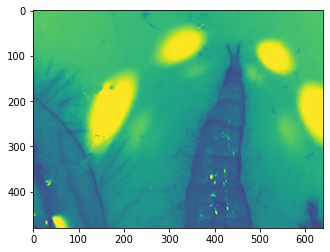

tensor([[0.753, 0.247]], grad_fn=<SoftmaxBackward0>)


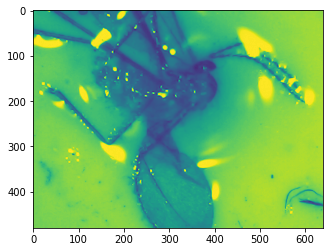

tensor([[0.915, 0.085]], grad_fn=<SoftmaxBackward0>)


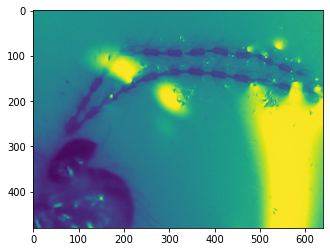

tensor([[0.809, 0.191]], grad_fn=<SoftmaxBackward0>)


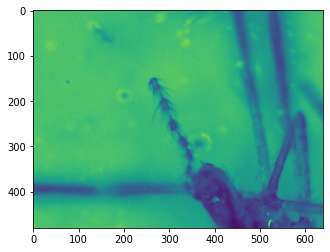

tensor([[0.744, 0.256]], grad_fn=<SoftmaxBackward0>)


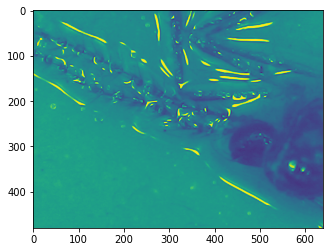

tensor([[0.584, 0.416]], grad_fn=<SoftmaxBackward0>)


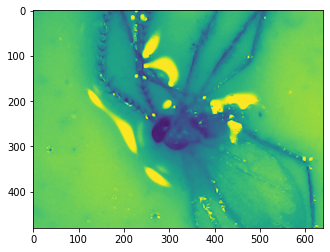

tensor([[0.684, 0.316]], grad_fn=<SoftmaxBackward0>)


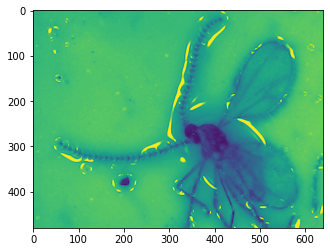

tensor([[0.569, 0.431]], grad_fn=<SoftmaxBackward0>)


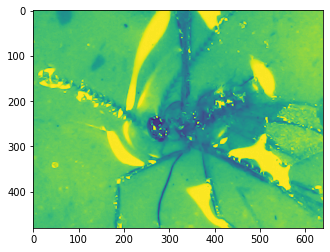

tensor([[0.697, 0.303]], grad_fn=<SoftmaxBackward0>)


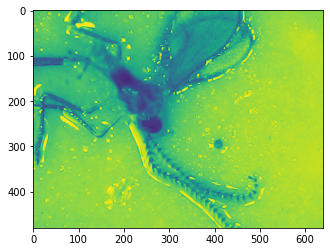

tensor([[0.690, 0.310]], grad_fn=<SoftmaxBackward0>)


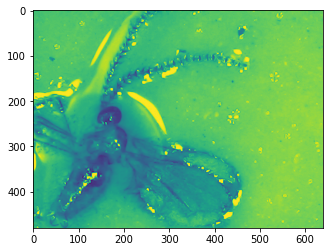

tensor([[0.603, 0.397]], grad_fn=<SoftmaxBackward0>)


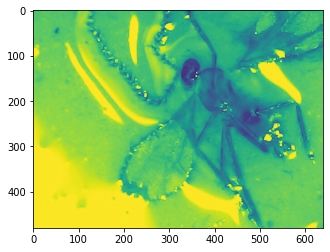

tensor([[0.757, 0.243]], grad_fn=<SoftmaxBackward0>)


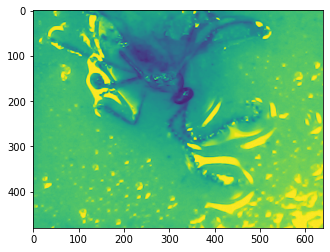

tensor([[0.576, 0.424]], grad_fn=<SoftmaxBackward0>)


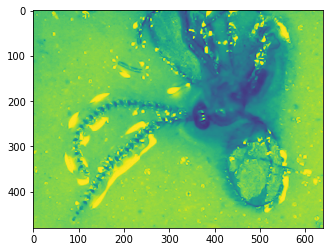

tensor([[0.574, 0.426]], grad_fn=<SoftmaxBackward0>)


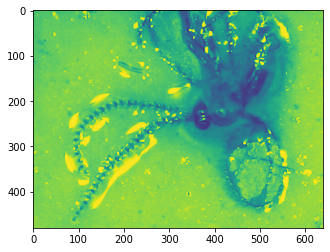

tensor([[0.574, 0.426]], grad_fn=<SoftmaxBackward0>)


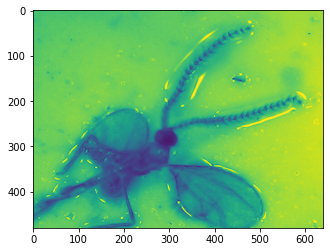

tensor([[0.711, 0.289]], grad_fn=<SoftmaxBackward0>)


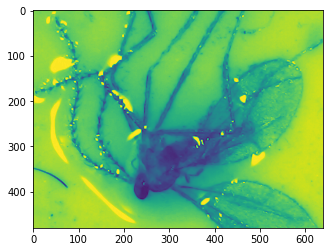

tensor([[0.688, 0.312]], grad_fn=<SoftmaxBackward0>)


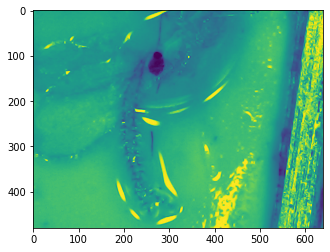

tensor([[0.669, 0.331]], grad_fn=<SoftmaxBackward0>)


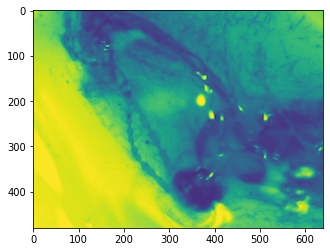

tensor([[0.557, 0.443]], grad_fn=<SoftmaxBackward0>)


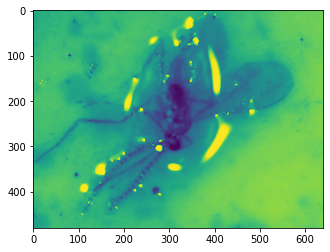

tensor([[0.706, 0.294]], grad_fn=<SoftmaxBackward0>)


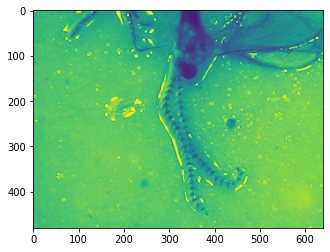

tensor([[0.642, 0.358]], grad_fn=<SoftmaxBackward0>)


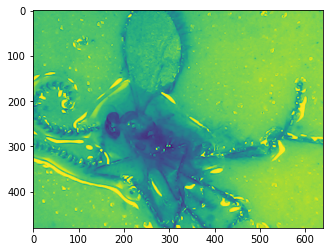

tensor([[0.633, 0.367]], grad_fn=<SoftmaxBackward0>)


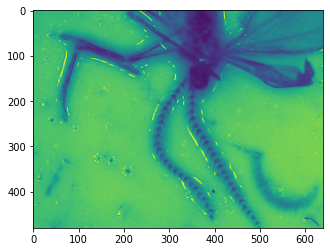

tensor([[0.619, 0.381]], grad_fn=<SoftmaxBackward0>)


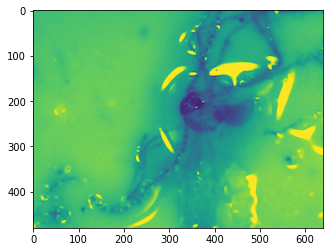

tensor([[0.826, 0.174]], grad_fn=<SoftmaxBackward0>)


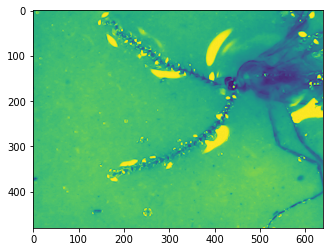

tensor([[0.568, 0.432]], grad_fn=<SoftmaxBackward0>)


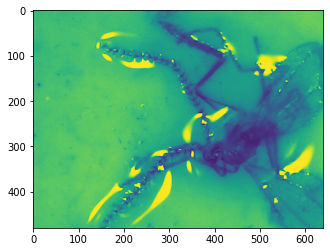

tensor([[0.589, 0.411]], grad_fn=<SoftmaxBackward0>)


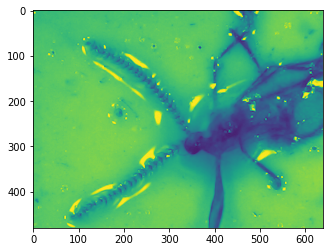

tensor([[0.730, 0.270]], grad_fn=<SoftmaxBackward0>)


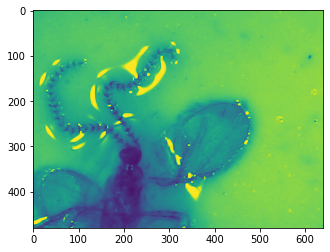

tensor([[0.692, 0.308]], grad_fn=<SoftmaxBackward0>)


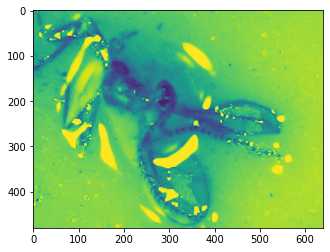

tensor([[0.569, 0.431]], grad_fn=<SoftmaxBackward0>)


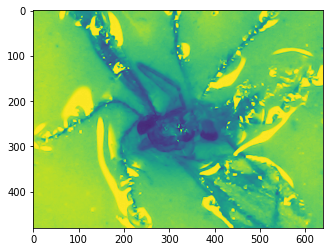

tensor([[0.508, 0.492]], grad_fn=<SoftmaxBackward0>)


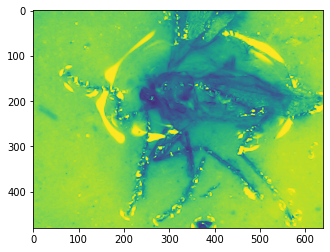

tensor([[0.632, 0.368]], grad_fn=<SoftmaxBackward0>)


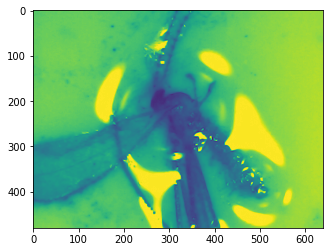

tensor([[0.550, 0.450]], grad_fn=<SoftmaxBackward0>)


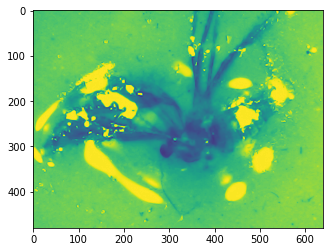

tensor([[0.534, 0.466]], grad_fn=<SoftmaxBackward0>)


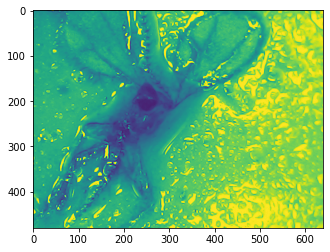

tensor([[0.397, 0.603]], grad_fn=<SoftmaxBackward0>)


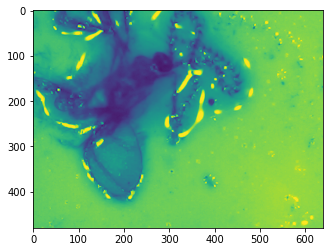

tensor([[0.586, 0.414]], grad_fn=<SoftmaxBackward0>)


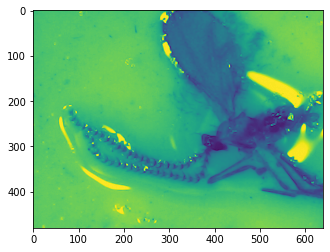

tensor([[0.474, 0.526]], grad_fn=<SoftmaxBackward0>)


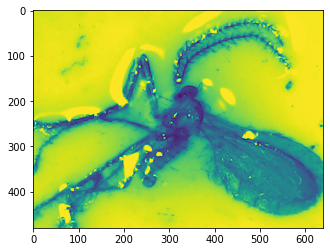

tensor([[0.532, 0.468]], grad_fn=<SoftmaxBackward0>)


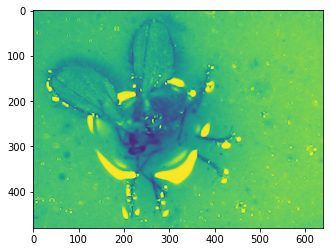

tensor([[0.492, 0.508]], grad_fn=<SoftmaxBackward0>)


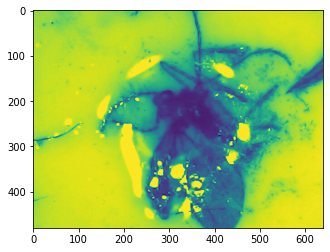

tensor([[0.522, 0.478]], grad_fn=<SoftmaxBackward0>)


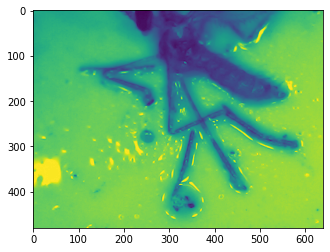

tensor([[0.523, 0.477]], grad_fn=<SoftmaxBackward0>)


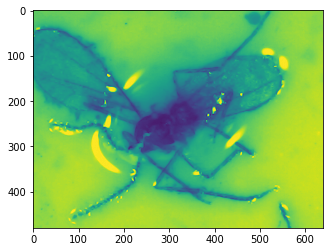

tensor([[0.581, 0.419]], grad_fn=<SoftmaxBackward0>)


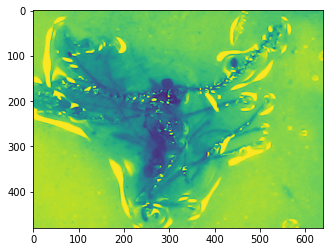

tensor([[0.646, 0.354]], grad_fn=<SoftmaxBackward0>)


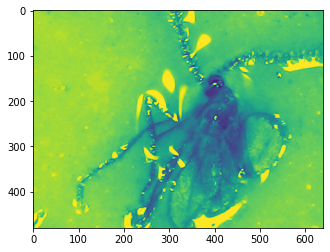

tensor([[0.595, 0.405]], grad_fn=<SoftmaxBackward0>)


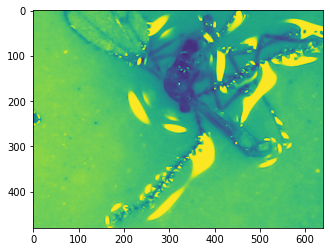

tensor([[0.400, 0.600]], grad_fn=<SoftmaxBackward0>)


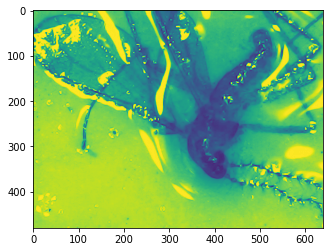

tensor([[0.588, 0.412]], grad_fn=<SoftmaxBackward0>)


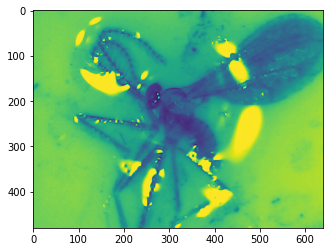

tensor([[0.674, 0.326]], grad_fn=<SoftmaxBackward0>)


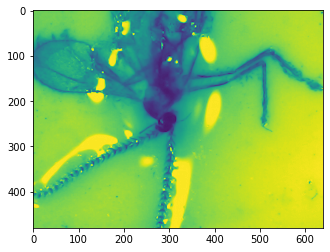

tensor([[0.713, 0.287]], grad_fn=<SoftmaxBackward0>)


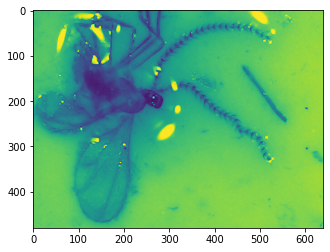

tensor([[0.071, 0.929]], grad_fn=<SoftmaxBackward0>)


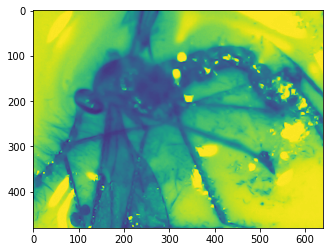

tensor([[0.710, 0.290]], grad_fn=<SoftmaxBackward0>)


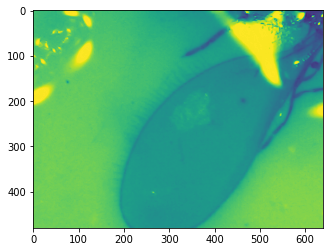

tensor([[0.269, 0.731]], grad_fn=<SoftmaxBackward0>)


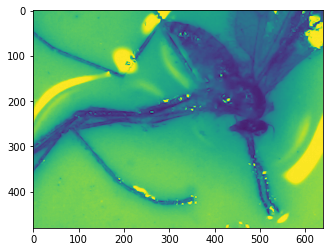

tensor([[0.667, 0.333]], grad_fn=<SoftmaxBackward0>)


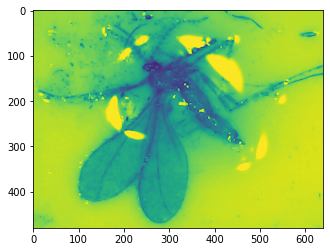

tensor([[0.941, 0.059]], grad_fn=<SoftmaxBackward0>)


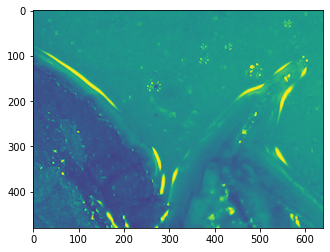

tensor([[0.866, 0.134]], grad_fn=<SoftmaxBackward0>)


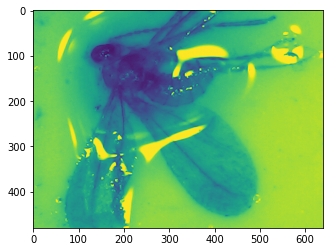

tensor([[0.761, 0.239]], grad_fn=<SoftmaxBackward0>)


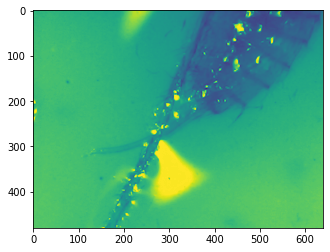

tensor([[0.680, 0.320]], grad_fn=<SoftmaxBackward0>)


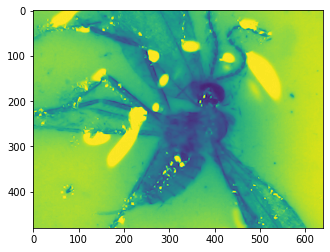

tensor([[0.861, 0.139]], grad_fn=<SoftmaxBackward0>)


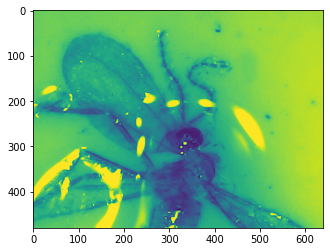

tensor([[0.879, 0.121]], grad_fn=<SoftmaxBackward0>)


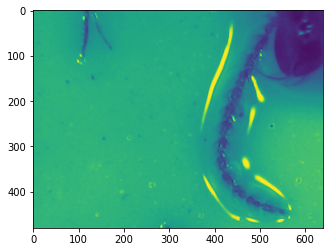

tensor([[0.735, 0.265]], grad_fn=<SoftmaxBackward0>)


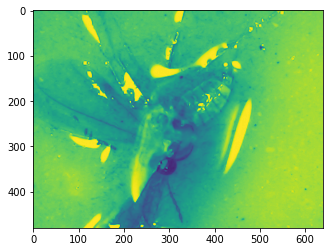

tensor([[0.631, 0.369]], grad_fn=<SoftmaxBackward0>)


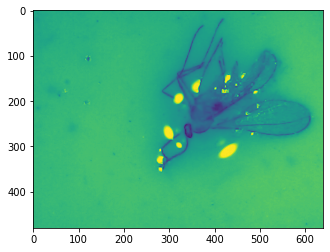

tensor([[0.672, 0.328]], grad_fn=<SoftmaxBackward0>)


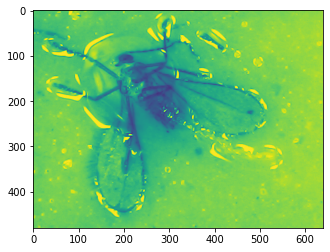

tensor([[0.619, 0.381]], grad_fn=<SoftmaxBackward0>)


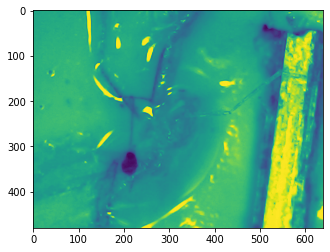

tensor([[0.469, 0.531]], grad_fn=<SoftmaxBackward0>)


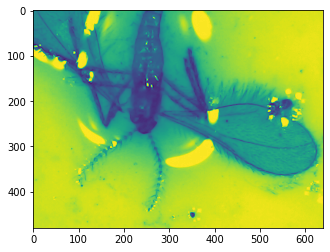

tensor([[0.581, 0.419]], grad_fn=<SoftmaxBackward0>)


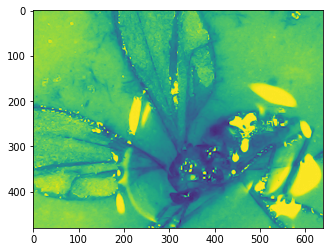

tensor([[0.659, 0.341]], grad_fn=<SoftmaxBackward0>)


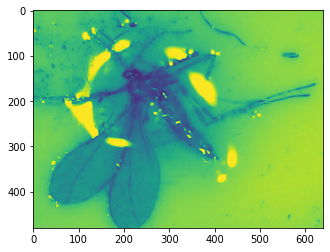

tensor([[0.606, 0.394]], grad_fn=<SoftmaxBackward0>)


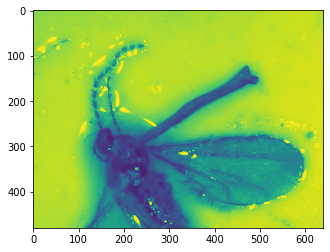

tensor([[0.532, 0.468]], grad_fn=<SoftmaxBackward0>)


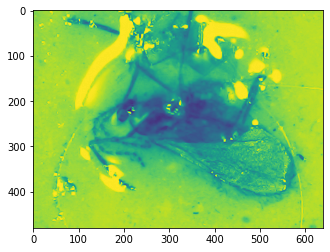

tensor([[0.799, 0.201]], grad_fn=<SoftmaxBackward0>)


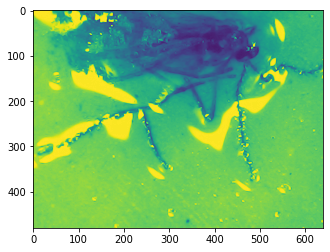

tensor([[0.668, 0.332]], grad_fn=<SoftmaxBackward0>)


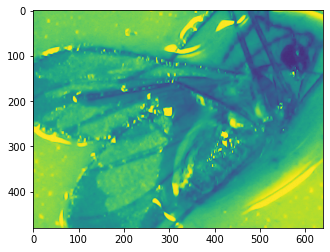

tensor([[0.688, 0.312]], grad_fn=<SoftmaxBackward0>)


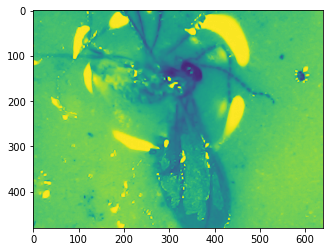

tensor([[0.694, 0.306]], grad_fn=<SoftmaxBackward0>)


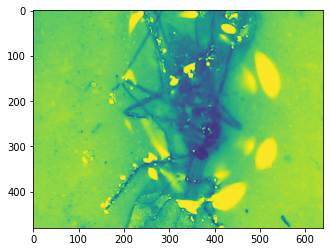

tensor([[0.806, 0.194]], grad_fn=<SoftmaxBackward0>)


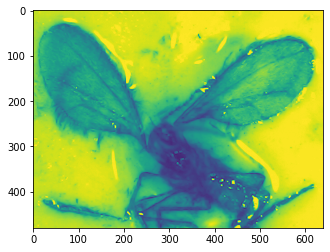

tensor([[0.763, 0.237]], grad_fn=<SoftmaxBackward0>)


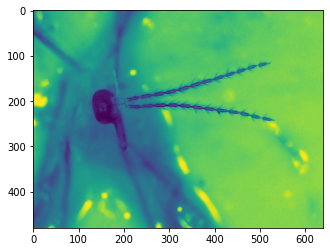

tensor([[0.695, 0.305]], grad_fn=<SoftmaxBackward0>)


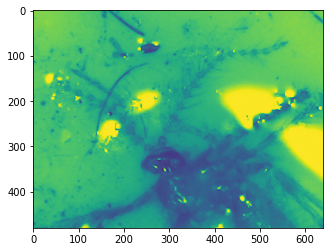

tensor([[0.690, 0.310]], grad_fn=<SoftmaxBackward0>)


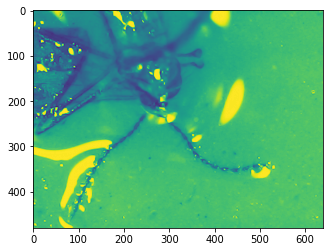

tensor([[0.530, 0.470]], grad_fn=<SoftmaxBackward0>)


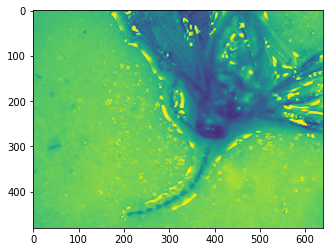

tensor([[0.532, 0.468]], grad_fn=<SoftmaxBackward0>)


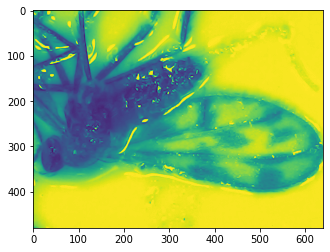

tensor([[0.525, 0.475]], grad_fn=<SoftmaxBackward0>)


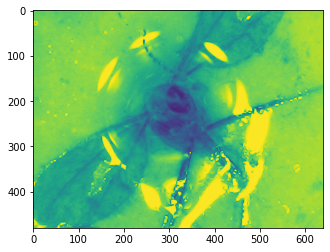

tensor([[0.523, 0.477]], grad_fn=<SoftmaxBackward0>)


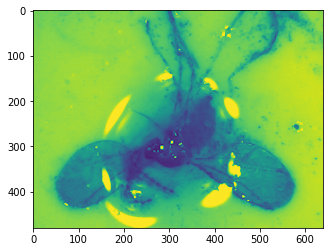

tensor([[0.718, 0.282]], grad_fn=<SoftmaxBackward0>)


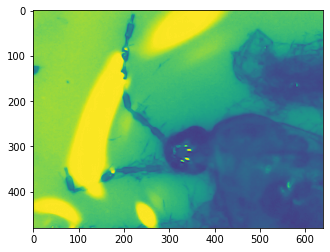

tensor([[0.612, 0.388]], grad_fn=<SoftmaxBackward0>)


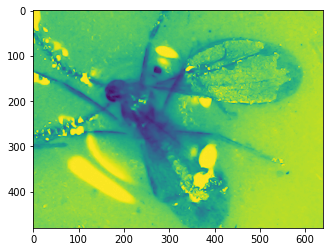

tensor([[0.411, 0.589]], grad_fn=<SoftmaxBackward0>)


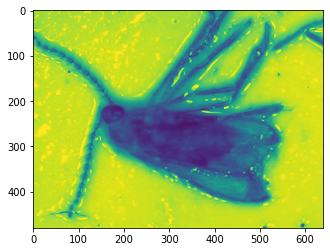

tensor([[0.627, 0.373]], grad_fn=<SoftmaxBackward0>)


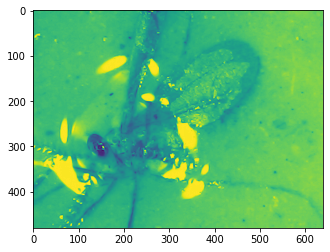

tensor([[0.554, 0.446]], grad_fn=<SoftmaxBackward0>)


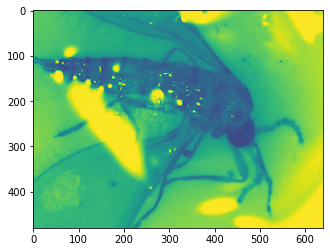

tensor([[0.669, 0.331]], grad_fn=<SoftmaxBackward0>)


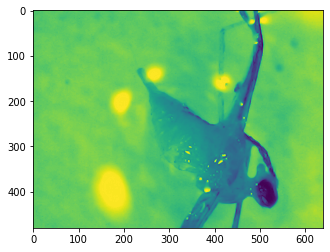

tensor([[0.597, 0.403]], grad_fn=<SoftmaxBackward0>)


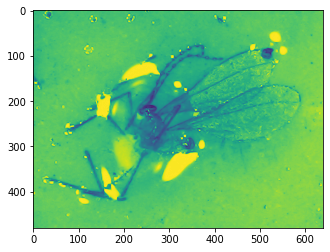

tensor([[0.597, 0.403]], grad_fn=<SoftmaxBackward0>)


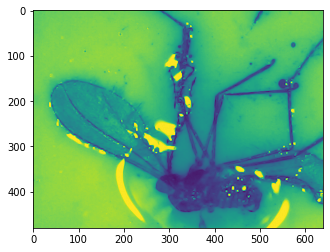

tensor([[0.681, 0.319]], grad_fn=<SoftmaxBackward0>)


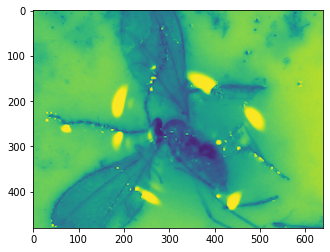

tensor([[0.576, 0.424]], grad_fn=<SoftmaxBackward0>)


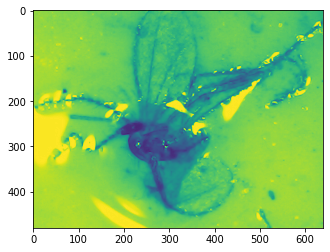

tensor([[0.596, 0.404]], grad_fn=<SoftmaxBackward0>)


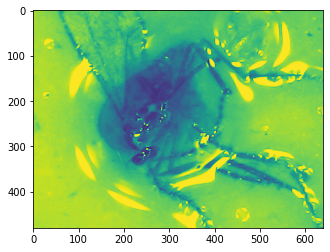

tensor([[0.582, 0.418]], grad_fn=<SoftmaxBackward0>)


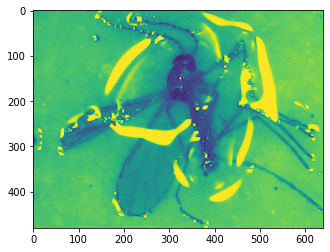

tensor([[0.774, 0.226]], grad_fn=<SoftmaxBackward0>)


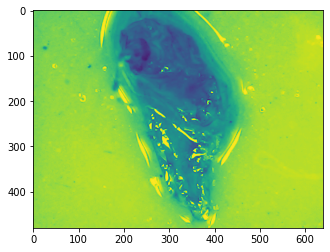

tensor([[0.611, 0.389]], grad_fn=<SoftmaxBackward0>)


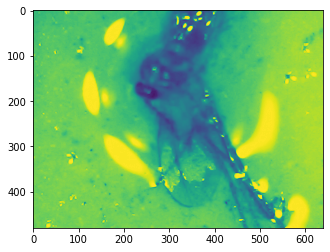

tensor([[0.654, 0.346]], grad_fn=<SoftmaxBackward0>)


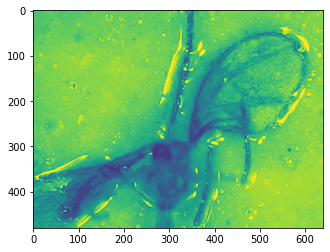

tensor([[0.463, 0.537]], grad_fn=<SoftmaxBackward0>)


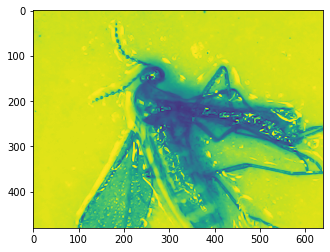

tensor([[0.585, 0.415]], grad_fn=<SoftmaxBackward0>)


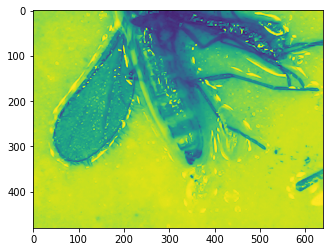

tensor([[0.685, 0.315]], grad_fn=<SoftmaxBackward0>)


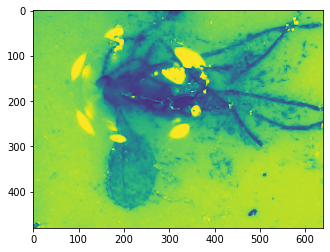

tensor([[0.544, 0.456]], grad_fn=<SoftmaxBackward0>)


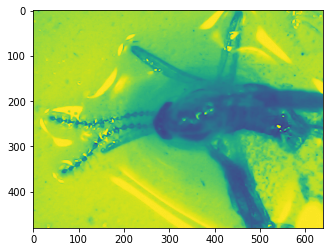

tensor([[0.596, 0.404]], grad_fn=<SoftmaxBackward0>)


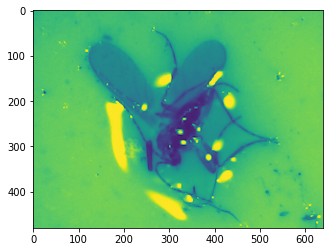

tensor([[0.670, 0.330]], grad_fn=<SoftmaxBackward0>)


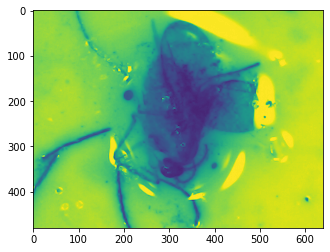

tensor([[0.006, 0.994]], grad_fn=<SoftmaxBackward0>)


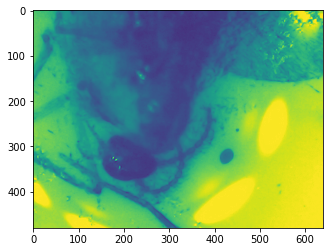

tensor([[0.694, 0.306]], grad_fn=<SoftmaxBackward0>)


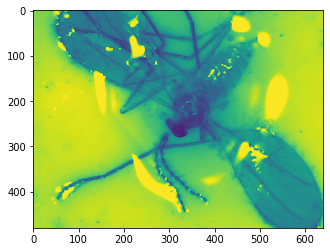

tensor([[0.817, 0.183]], grad_fn=<SoftmaxBackward0>)


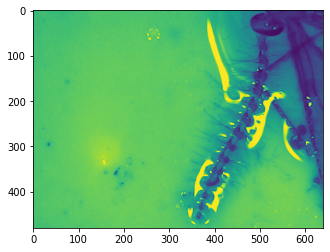

tensor([[0.603, 0.397]], grad_fn=<SoftmaxBackward0>)


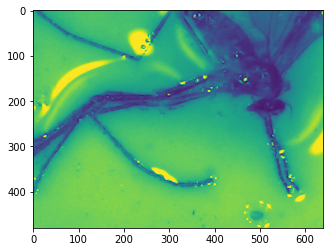

tensor([[0.742, 0.258]], grad_fn=<SoftmaxBackward0>)


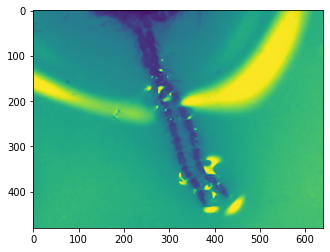

tensor([[0.468, 0.532]], grad_fn=<SoftmaxBackward0>)


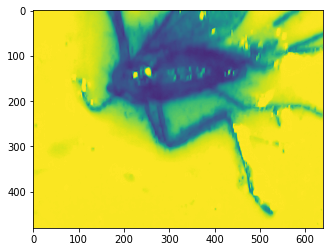

tensor([[0.563, 0.437]], grad_fn=<SoftmaxBackward0>)


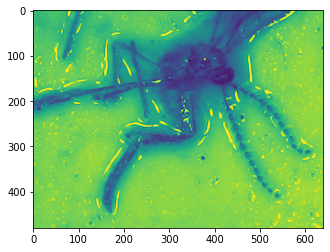

tensor([[0.939, 0.061]], grad_fn=<SoftmaxBackward0>)


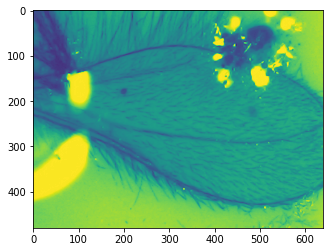

tensor([[0.866, 0.134]], grad_fn=<SoftmaxBackward0>)


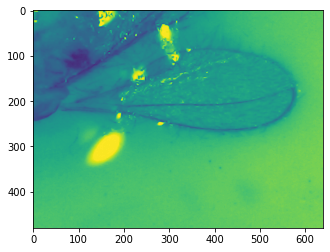

tensor([[0.705, 0.295]], grad_fn=<SoftmaxBackward0>)


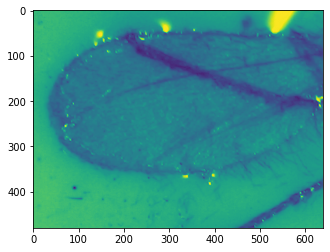

tensor([[0.722, 0.278]], grad_fn=<SoftmaxBackward0>)


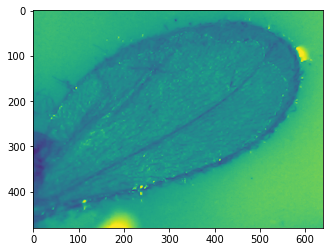

tensor([[0.617, 0.383]], grad_fn=<SoftmaxBackward0>)


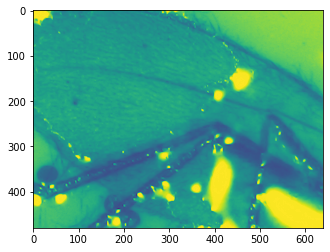

tensor([[0.232, 0.768]], grad_fn=<SoftmaxBackward0>)


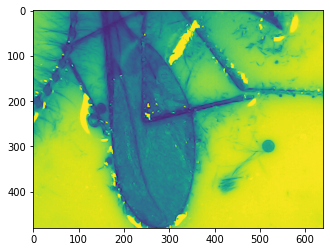

tensor([[0.795, 0.205]], grad_fn=<SoftmaxBackward0>)


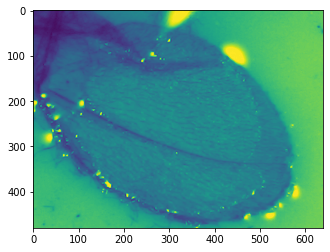

tensor([[0.480, 0.520]], grad_fn=<SoftmaxBackward0>)


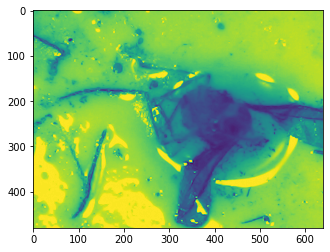

tensor([[0.590, 0.410]], grad_fn=<SoftmaxBackward0>)


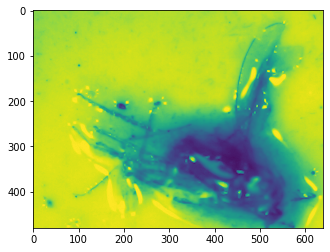

tensor([[0.601, 0.399]], grad_fn=<SoftmaxBackward0>)


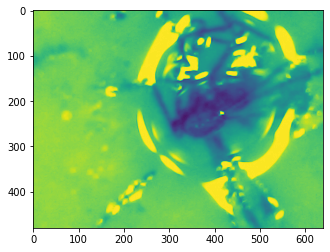

tensor([[0.065, 0.935]], grad_fn=<SoftmaxBackward0>)


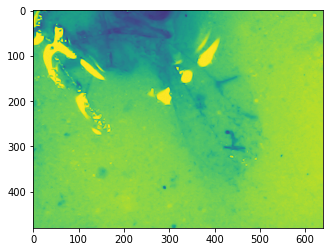

tensor([[0.590, 0.410]], grad_fn=<SoftmaxBackward0>)


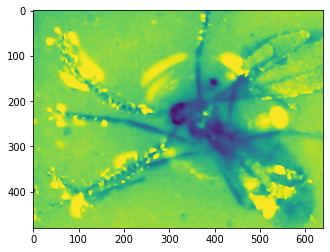

In [ ]:
import matplotlib.pyplot as plt
for i,tensor in enumerate((tensorims),0):
    blackwhite = torchvision.transforms.Grayscale()(tensor)
    plt.imshow(torch.flatten(blackwhite,0,2))
    print(nn.Softmax(dim=1)(net(tensor)))
    plt.show()

tensor([[0.763, 0.237]], grad_fn=<SoftmaxBackward0>)


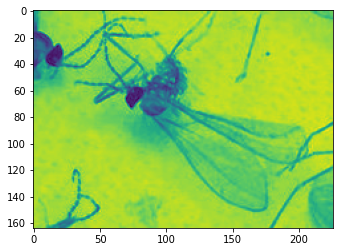

tensor([[0.543, 0.457]], grad_fn=<SoftmaxBackward0>)


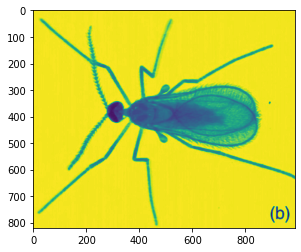

tensor([[0., 1.]], grad_fn=<SoftmaxBackward0>)


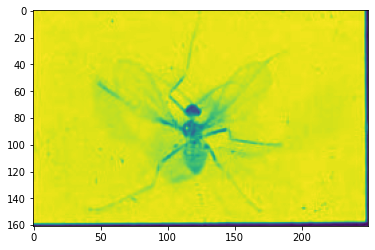

tensor([[0.585, 0.415]], grad_fn=<SoftmaxBackward0>)


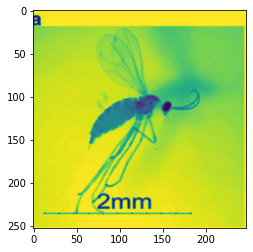

tensor([[0.655, 0.345]], grad_fn=<SoftmaxBackward0>)


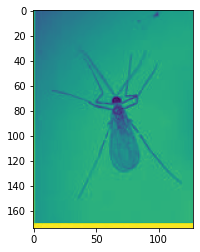

tensor([[0.785, 0.215]], grad_fn=<SoftmaxBackward0>)


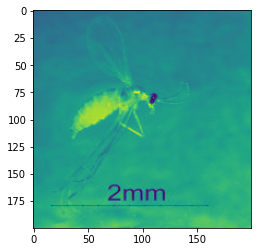

tensor([[0.342, 0.658]], grad_fn=<SoftmaxBackward0>)


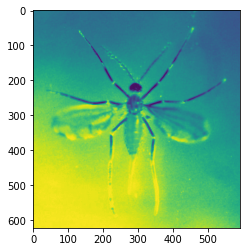

tensor([[0.244, 0.756]], grad_fn=<SoftmaxBackward0>)


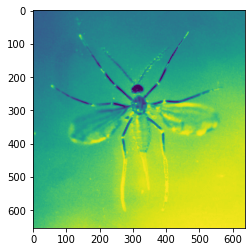

tensor([[0.658, 0.342]], grad_fn=<SoftmaxBackward0>)


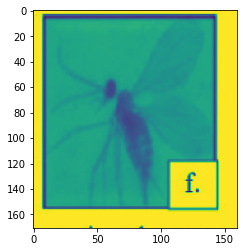

tensor([[0.654, 0.346]], grad_fn=<SoftmaxBackward0>)


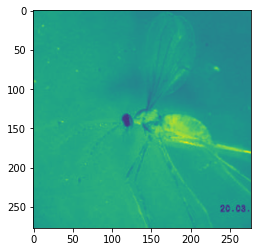

tensor([[0.621, 0.379]], grad_fn=<SoftmaxBackward0>)


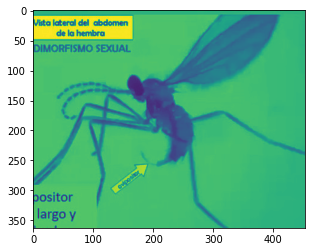

tensor([[0.632, 0.368]], grad_fn=<SoftmaxBackward0>)


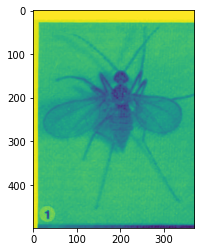

tensor([[0.614, 0.386]], grad_fn=<SoftmaxBackward0>)


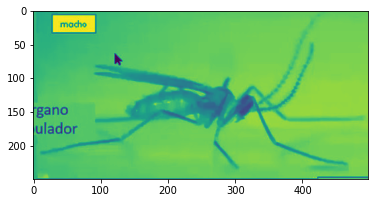

tensor([[0.637, 0.363]], grad_fn=<SoftmaxBackward0>)


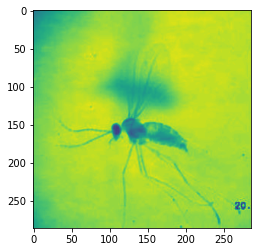

In [ ]:
import matplotlib.pyplot as plt
for i,tensor in enumerate((testtensorims),0):
    blackwhite = torchvision.transforms.Grayscale()(tensor)
    print(nn.Softmax(dim=1)(net(tensor)))
    plt.imshow(torch.flatten(blackwhite,0,2))
    plt.show()

# L1 regularization for sparcity
A way to penalize weight to try and get a robust model is the following, however as there aren't as many resources for this penalization *in Deep Learning* we are still open to other implemtantions found online, and other alternatives that maybe work better in relation to neural nets

In [ ]:
l1_reg = None
for W in net.parameters():
    if l1_reg is None:
        l1_reg = W.norm(1)
    else:
        l1_reg = l1_reg + W.norm(1)
lambda1 =0.5 

In [ ]:
def regloss(output,target):
  return nn.L1Loss()(output, target)+(l1_reg.sum() * lambda1).values()



# Referencias 

Boyd, Stephen, et al. "Distributed optimization and statistical learning via the alternating direction method of multipliers." Foundations and Trends® in Machine learning 3.1 (2011): 1-122.

Coast, Gold, et al. "Convex optimization: a new approach to common challenges in premium rating." (2010).